In [1]:
# building the models 

import os

from datetime import datetime

from utils.data_utils import *
from utils.diff_utils import *

from model.UNet import UNet

In [2]:
T = 1000
BATCH_SIZE = 100
IMAGE_SIZE = 128
CHANNELS = 1

dataloader = get_dataloader(batch_size=BATCH_SIZE, shuffle=True)
print(len(dataloader))

betas = linear_beta_schedule(T)
params = get_forward_diffusion_parameters(betas)

pixel (max, min) = (0.55, -0.51)
10


In [3]:
# training
from torch.optim import Adam
from pathlib import Path

result_folder = results_folder = Path("/home/ubuntu/diffusion_results")
results_folder.mkdir(exist_ok=True)
save_and_sample_every = 200


device = "cuda:0" if torch.cuda.is_available() else "cpu"

noise2noise = UNet(dim=IMAGE_SIZE, channels=CHANNELS, dim_mults=(1, 2, 4), use_convnext=False)
print('Number of Parameters = ', sum(p.numel() for p in noise2noise.parameters() if p.requires_grad))

if torch.cuda.device_count() > 1: print("Using", torch.cuda.device_count(), "GPUs!")

# anyway use DataParallel such that the model dict matches 
noise2noise = torch.nn.DataParallel(noise2noise)
noise2noise.to(device)
# optimizer = Adam(noise2noise.parameters(), lr=1e-3)
optimizer = Adam(noise2noise.parameters(), lr=1e-4)

Number of Parameters =  32001129
Using 4 GPUs!


In [5]:
# load the fully trained model
# noise2noise.load_state_dict(torch.load('/home/ubuntu/trained_models/DiffEM_1000_1000_2022-12-14-19-39-03.pt'))

<All keys matched successfully>

In [ ]:
# training
epochs = 1000

for epoch in tqdm(range(epochs)):
    
    for step, batch_images in enumerate(dataloader):
        
        optimizer.zero_grad()

        batch_size = batch_images.shape[0]
        batch_images = batch_images.to(device)

        # Algorithm 1 line 3: sample t uniformally for every example in the batch
        t = torch.randint(0, T, (batch_size, ), device=device, dtype=torch.long)

        loss = p_losses(noise2noise, batch_images, t, params, loss_type='L1')

        # if step % 100 == 0: print(f'Epoch: {epoch:02d} | Step: {step:03d} | Loss: {loss.item():.3f}')

        loss.backward()
        optimizer.step()
    
    if epoch % 100 == 0: print(f'Epoch: {epoch:02d} | Step: {step:03d} | Loss: {loss.item():.3f}')

    # save generated images
    # if epoch % save_and_sample_every == 0:
    #     milestone = step // save_and_sample_every
    #     batches = num_to_groups(4, batch_size)
    #     all_images_list = list(map(lambda n: sample(model, 28, batch_size=n, channels=channels), batches))
    #     # print(all_images_list[0])
    #     all_images = torch.tensor(np.concatenate(all_images_list[0]))
    #     all_images = (all_images + 1) * 0.5
    #     save_image(all_images, str(results_folder / f'sample-{epoch}-{milestone}.png'), nrow = 6)


now = datetime.now().strftime("%Y-%m-%d-%H-%M-%S")
model_name = f'DiffEM_1000_{epochs}_{now}'
torch.save(noise2noise.state_dict(), os.path.join('/home/ubuntu/trained_models/', f'{model_name}.pt'))



  0%|          | 0/1000 [00:00<?, ?it/s]

Epoch: 00 | Step: 009 | Loss: 0.787
Epoch: 100 | Step: 009 | Loss: 0.043
Epoch: 200 | Step: 009 | Loss: 0.036
Epoch: 300 | Step: 009 | Loss: 0.033
Epoch: 400 | Step: 009 | Loss: 0.025
Epoch: 500 | Step: 009 | Loss: 0.029
Epoch: 600 | Step: 009 | Loss: 0.017


## Sample images

In [ ]:
%%time
# sample 64 images
samples = sample(noise2noise, image_size=IMAGE_SIZE, batch_size=64, channels=CHANNELS, params=params)
ts = [0, 50, int(0.5 * T), int(0.75 * T), int(0.9 * T), T-10, T-5, T-3, T-2, T-1]
samples_for_plot = [[torch.tensor(samples[j][6 * i, 0, :, :]) for j in ts] for i in range(10)]
plot(samples_for_plot)

In [73]:
# sample images and save as mrcs
sample_dct = {T-1: [], T-10: [], int(0.9 * T): [], int(0.8 * T): []}

for _ in tqdm(range(50)): 
    samples = sample(noise2noise, image_size=IMAGE_SIZE, batch_size=100, channels=CHANNELS, params=params)
    for k in sample_dct.keys():
        sample_dct[k].append(samples[k])
    # break
    
for k in sample_dct.keys():
    data = np.concatenate(sample_dct[k])
    filepath = f'/home/ubuntu/data/random_generative/naive_generative_T{k}.mrcs'
    write_mrcs(filepath, data)
    
    s3cmd = f'aws s3 cp {filepath} s3://seismictx-cryoem/diffem/data/random_generative/naive_generative_T{k}.mrcs'
    os.system(s3cmd)
    

  0%|          | 0/50 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

Sampling Loop Timestep:   0%|          | 0/1000 [00:00<?, ?it/s]

## Denoising from Samples

In [9]:
# denoise the samples 

noise_idx = 750
t = 999 - noise_idx
noise_scale = 0.0

data = torch.tensor(samples[noise_idx]).clone().to(device)
denoised = denoise(noise2noise, data, t, t, params, noise_scale=noise_scale)

ts = [0, int(0.1 * t), int(0.5 * t), int(0.75 * t), int(0.9 * t), t-10, t-5, t-3, t-2, t-1]
samples_for_plot = [[torch.tensor(denoised[j][6 * i, 0, :, :]) for j in ts] for i in range(3)]
plot(samples_for_plot)

Denoising 249 to 0: 0it [00:00, ?it/s]

In [10]:
# denoise the samples second trial
data = torch.tensor(samples[noise_idx]).clone().to(device)
denoised = denoise(noise2noise, data, t, t, params, noise_scale=0.5)
samples_for_plot = [[torch.tensor(denoised[j][6 * i, 0, :, :]) for j in ts] for i in range(3)]
plot(samples_for_plot)

Denoising 249 to 0: 0it [00:00, ?it/s]

In [11]:
# denoise the samples second trial
data = torch.tensor(samples[noise_idx]).clone().to(device)
denoised = denoise(noise2noise, data, t, t, params, noise_scale=0.5)
samples_for_plot = [[torch.tensor(denoised[j][6 * i, 0, :, :]) for j in ts] for i in range(3)]
plot(samples_for_plot)

Denoising 249 to 0: 0it [00:00, ?it/s]

In [ ]:
# No hallucination: 
# high noise: low res
# low noise: high res

# 0.5 hallucination: 
# high noise: high res + hallucination
# low noise: high res (deterministic)

# 1.0 hallucination: 
# high noise: hallucinated
# low noise: high res 


## Generate images for mrcs

In [5]:
%%time
# load experimental data
test_images = read_mrcs('/home/ubuntu/data/test-5k/5k-test.mrcs')
test_truths = read_mrcs('/home/ubuntu/data/test-5k/5k-test-projs.mrcs')
print(test_images.shape)
print(test_truths.shape)

pixel (max, min) = (5.93, -6.29)
pixel (max, min) = (0.87, -0.61)
torch.Size([5000, 1, 128, 128])
torch.Size([5000, 1, 128, 128])
CPU times: user 583 ms, sys: 1.29 s, total: 1.88 s
Wall time: 1.45 s


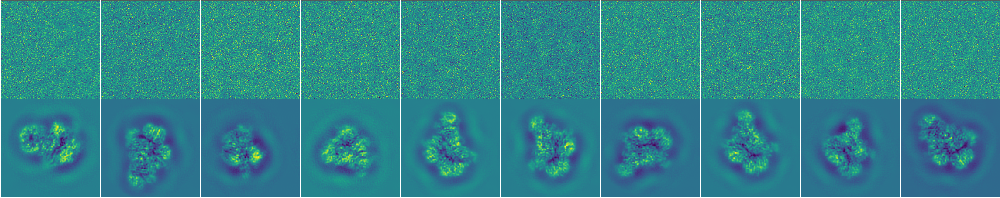

In [6]:
plot([[test_images[i, 0, :, :] for i in range(10)], [test_truths[i, 0, :, :] for i in range(10)]])

In [24]:
# denoise the samples 

n_samples = 10
noise_idx = 750
t = 999 - noise_idx
noise_scale = 0.1

data = test_images[:n_samples].clone().to(device)
denoised = denoise(noise2noise, data, t, t, params, noise_scale=noise_scale)
truth = test_truths[:n_samples].clone().to(device)

ts = [0, int(0.1 * t), int(0.5 * t), int(0.75 * t), int(0.9 * t), t-10, t-5, t-3, t-2, t-1]
samples_for_plot = [[torch.tensor(denoised[j][i, 0, :, :]) for j in ts] + [truth[i, 0, :, :].cpu()] for i in range(10)]
plot(samples_for_plot)


Denoising 249 to 0: 0it [00:00, ?it/s]